# SisFall — ADL (Non-Fall) Gallery

Mirrors the structure of `SisFall_falls_gallery.ipynb` but for the **19 Activities of Daily Living** (D01–D19).

- First figure: 20 randomly chosen ADL recordings from any class.
- Then one figure per ADL class (D01–D19), each showing up to 20 randomly sampled recordings.

In [1]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from collections import defaultdict

SISFALL_PATH = 'SisFall_dataset'
ADXL_SCALE   = (2 * 16) / (2**13)   # g per bit
AXIS_COLORS  = ['#1f77b4', '#d62728', '#2ca02c']   # blue=X, red=Y, green=Z

ADL_DESC = {
    'D01': 'Walking slowly',
    'D02': 'Walking quickly',
    'D03': 'Jogging slowly',
    'D04': 'Jogging quickly',
    'D05': 'Walking upstairs and downstairs slowly',
    'D06': 'Walking upstairs and downstairs quickly',
    'D07': 'Sit in half-height chair slowly, then stand',
    'D08': 'Sit in half-height chair quickly, then stand',
    'D09': 'Sit in low chair slowly, then stand',
    'D10': 'Sit in low chair quickly, then stand',
    'D11': 'Try to get up, collapse into chair',
    'D12': 'Lie slowly from sitting, then sit again',
    'D13': 'Lie quickly from sitting, then sit again',
    'D14': 'Back to lateral position and back',
    'D15': 'Standing, bend at knees slowly, then up',
    'D16': 'Standing, bend without bending knees, then up',
    'D17': 'Get into a car, sit, then get out',
    'D18': 'Stumble while walking',
    'D19': 'Jump to reach a high object',
}

print('Setup done.')

Setup done.


In [2]:
def load_adxl(filepath):
    """Read a SisFall .txt file and return ADXL345 X/Y/Z in g as a (N, 3) float array."""
    rows = []
    with open(filepath) as f:
        for line in f:
            line = line.strip().rstrip(';')
            if not line:
                continue
            try:
                parts = [int(x.strip()) for x in line.split(',')]
                if len(parts) == 9:
                    rows.append(parts[:3])
            except ValueError:
                pass
    return np.array(rows, dtype=np.float32) * ADXL_SCALE


# Collect all ADL files across every subject
all_adl_files = []
for subj in sorted(os.listdir(SISFALL_PATH)):
    subj_path = os.path.join(SISFALL_PATH, subj)
    if not os.path.isdir(subj_path):
        continue
    for fname in os.listdir(subj_path):
        if fname.endswith('.txt') and fname.startswith('D'):
            all_adl_files.append(os.path.join(subj_path, fname))

# Index by code
files_by_code = defaultdict(list)
for fpath in all_adl_files:
    code = os.path.basename(fpath).split('_')[0]
    files_by_code[code].append(fpath)

print(f'Total ADL files found: {len(all_adl_files)}')
print()
for code in sorted(files_by_code):
    print(f'{code}: {len(files_by_code[code]):>4} files  ({ADL_DESC.get(code, "")})')

Total ADL files found: 2707

D01:   38 files  (Walking slowly)
D02:   38 files  (Walking quickly)
D03:   38 files  (Jogging slowly)
D04:   36 files  (Jogging quickly)
D05:  190 files  (Walking upstairs and downstairs slowly)
D06:  118 files  (Walking upstairs and downstairs quickly)
D07:  190 files  (Sit in half-height chair slowly, then stand)
D08:  190 files  (Sit in half-height chair quickly, then stand)
D09:  185 files  (Sit in low chair slowly, then stand)
D10:  185 files  (Sit in low chair quickly, then stand)
D11:  190 files  (Try to get up, collapse into chair)
D12:  190 files  (Lie slowly from sitting, then sit again)
D13:  120 files  (Lie quickly from sitting, then sit again)
D14:  190 files  (Back to lateral position and back)
D15:  190 files  (Standing, bend at knees slowly, then up)
D16:  190 files  (Standing, bend without bending knees, then up)
D17:  189 files  (Get into a car, sit, then get out)
D18:  120 files  (Stumble while walking)
D19:  120 files  (Jump to reach a 

---
## Figure 1 — 20 randomly chosen ADL recordings (all classes mixed)

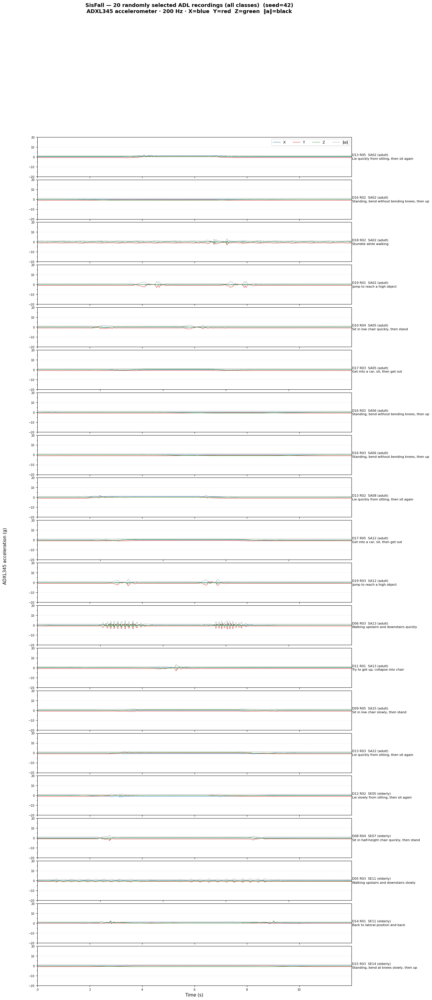

Saved signals_png/sisfall_adl_gallery.png


In [3]:
N_PLOTS = 20
SEED    = 42

random.seed(SEED)
chosen = sorted(random.sample(all_adl_files, N_PLOTS))

fig, axes = plt.subplots(
    N_PLOTS, 1,
    figsize=(14, N_PLOTS * 1.9),
    gridspec_kw={'hspace': 0.08},
)

for ax, fpath in zip(axes, chosen):
    fname = os.path.basename(fpath)
    code, subj, trial = fname.replace('.txt', '').split('_')
    desc  = ADL_DESC.get(code, code)
    group = 'adult' if subj.startswith('SA') else 'elderly'

    acc = load_adxl(fpath)
    t   = np.arange(len(acc)) / 200.0

    for i, (axis_name, color) in enumerate(zip(['X', 'Y', 'Z'], AXIS_COLORS)):
        ax.plot(t, acc[:, i], color=color, linewidth=0.8,
                label=axis_name if ax is axes[0] else None)

    mag = np.linalg.norm(acc, axis=1)
    ax.plot(t, mag, color='black', linewidth=0.6, alpha=0.45,
            label='‖a‖' if ax is axes[0] else None)

    ax.axhline(0, color='grey', linewidth=0.4, linestyle=':')
    ax.set_xlim(0, t[-1])
    ax.set_ylim(-20, 20)
    ax.yaxis.set_major_locator(ticker.MultipleLocator(10))
    ax.yaxis.set_minor_locator(ticker.MultipleLocator(5))
    ax.tick_params(axis='y', labelsize=7)
    ax.tick_params(axis='x', labelsize=7)
    ax.grid(True, axis='y', alpha=0.2)

    label_text = f'{code} {trial}  {subj} ({group})\n{desc}'
    ax.text(1.002, 0.5, label_text,
            transform=ax.transAxes,
            va='center', ha='left',
            fontsize=8, linespacing=1.4)

    if ax is not axes[-1]:
        ax.set_xticklabels([])

axes[-1].set_xlabel('Time (s)', fontsize=11)
fig.text(0.04, 0.5, 'ADXL345 acceleration (g)', va='center',
         rotation='vertical', fontsize=11)
axes[0].legend(loc='upper right', fontsize=9, ncol=4, framealpha=0.8)

fig.suptitle(
    f'SisFall — {N_PLOTS} randomly selected ADL recordings (all classes)  (seed={SEED})\n'
    'ADXL345 accelerometer · 200 Hz · X=blue  Y=red  Z=green  ‖a‖=black',
    fontsize=13, fontweight='bold', y=1.002
)

os.makedirs('signals_png', exist_ok=True)
plt.savefig('signals_png/sisfall_adl_gallery.png', dpi=120, bbox_inches='tight')
plt.show()
print('Saved signals_png/sisfall_adl_gallery.png')

---
## Per-class galleries — one figure for each of the 19 ADL types

Saved signals_png/sisfall_gallery_D01.png


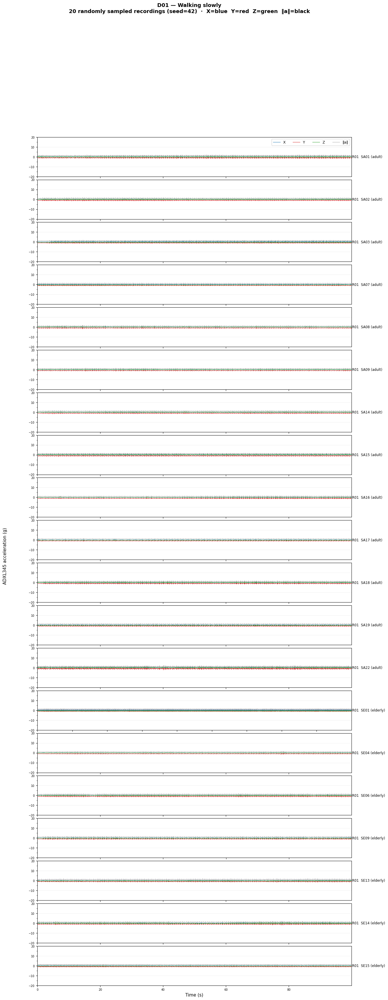

Saved signals_png/sisfall_gallery_D02.png


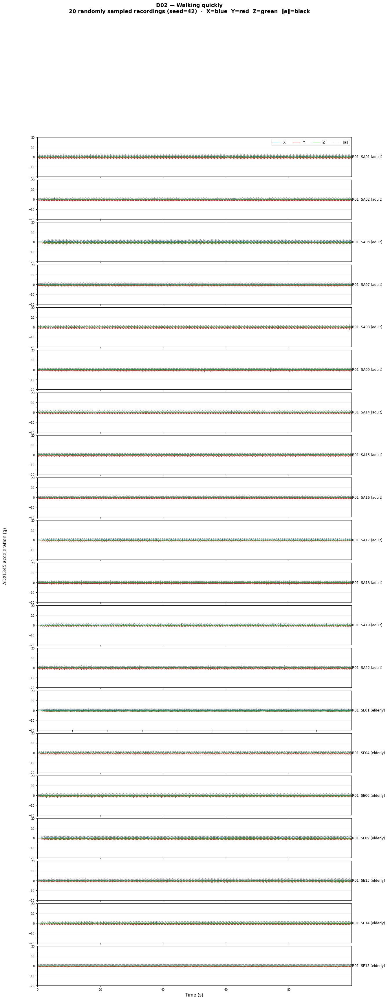

Saved signals_png/sisfall_gallery_D03.png


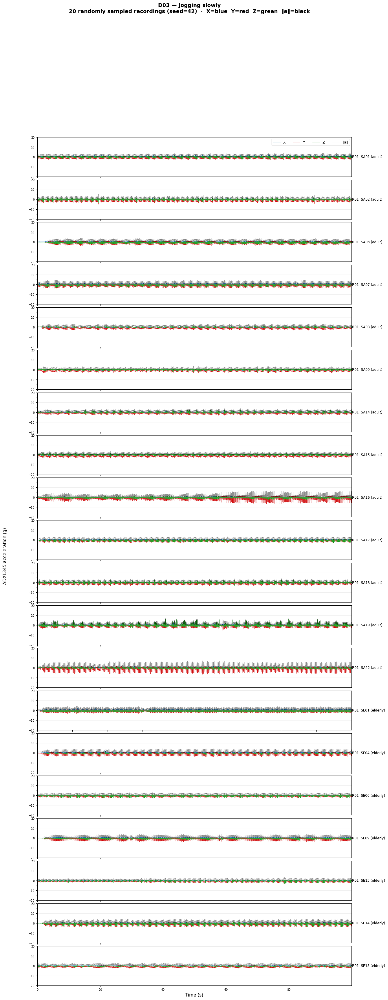

Saved signals_png/sisfall_gallery_D04.png


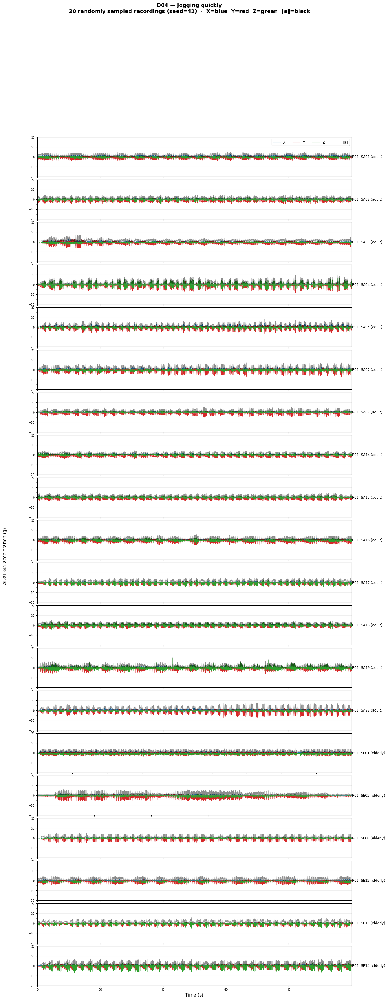

Saved signals_png/sisfall_gallery_D05.png


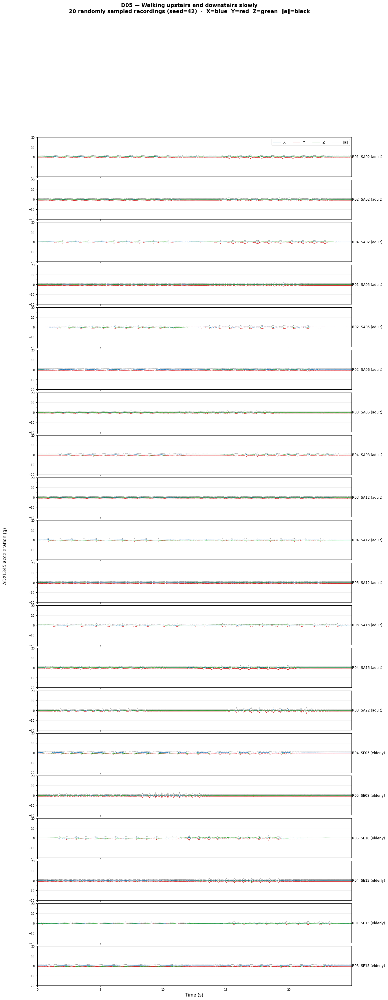

Saved signals_png/sisfall_gallery_D06.png


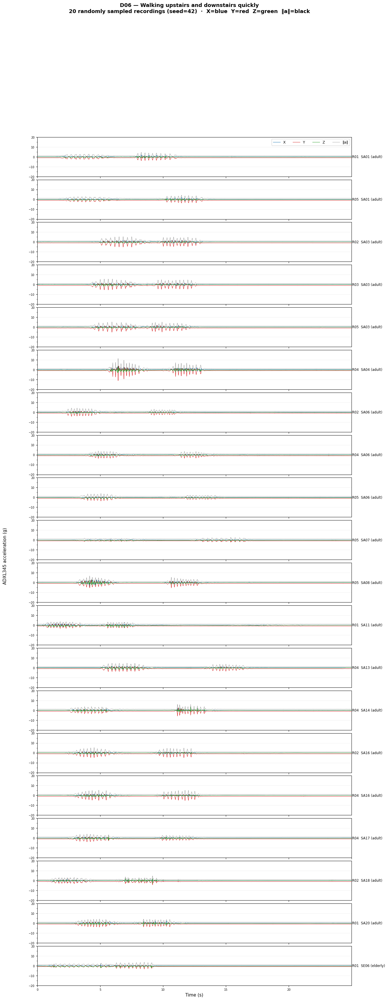

Saved signals_png/sisfall_gallery_D07.png


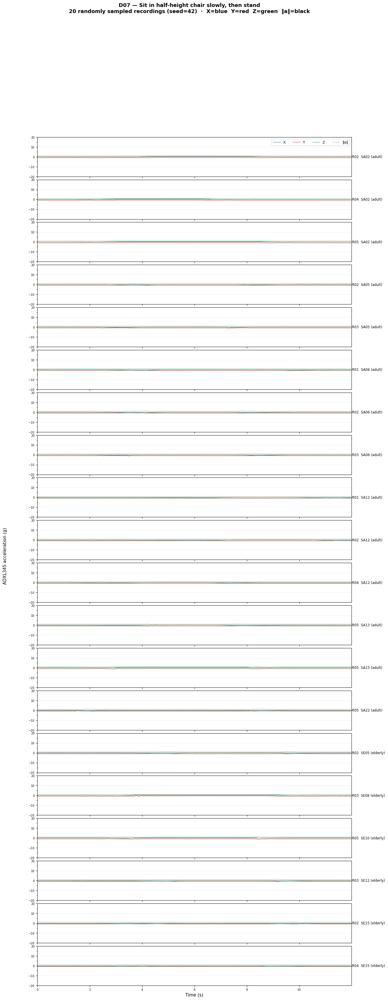

Saved signals_png/sisfall_gallery_D08.png


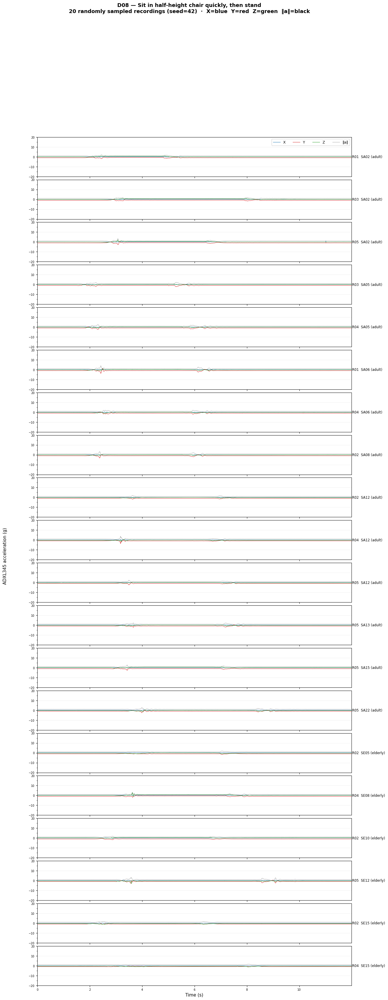

Saved signals_png/sisfall_gallery_D09.png


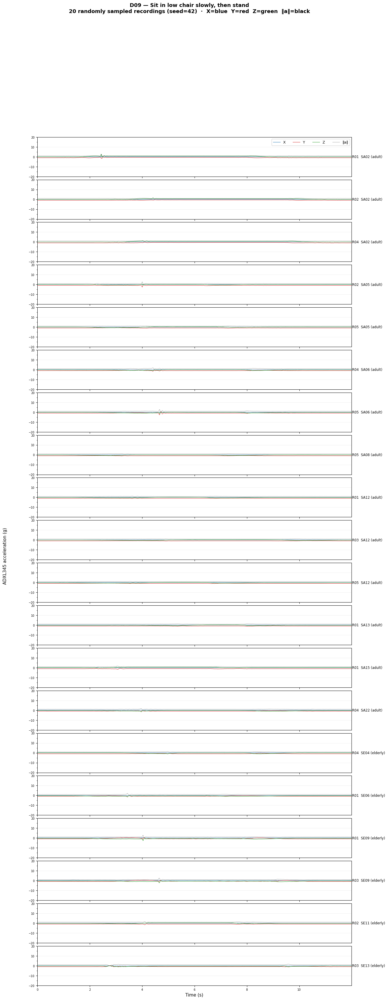

Saved signals_png/sisfall_gallery_D10.png


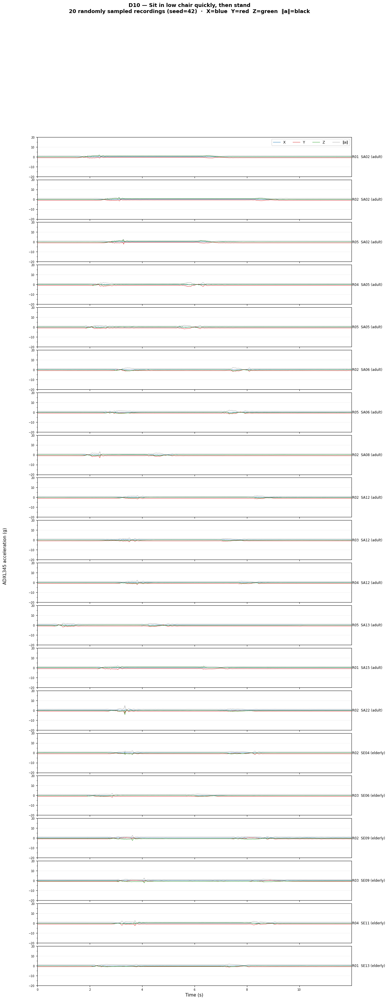

Saved signals_png/sisfall_gallery_D11.png


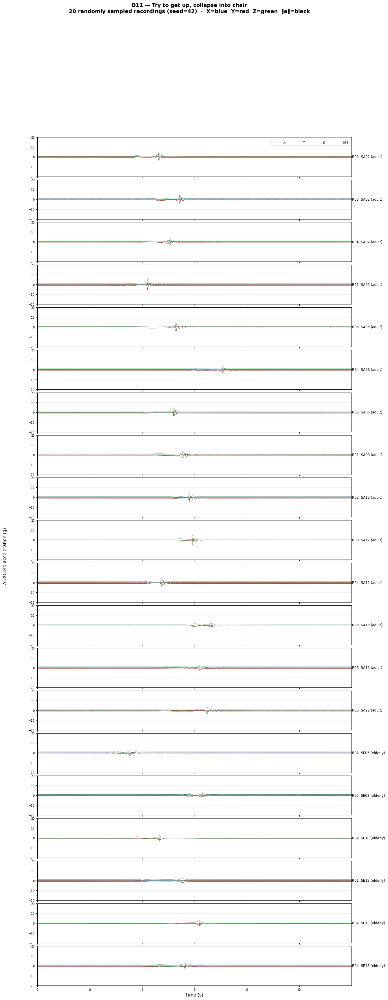

Saved signals_png/sisfall_gallery_D12.png


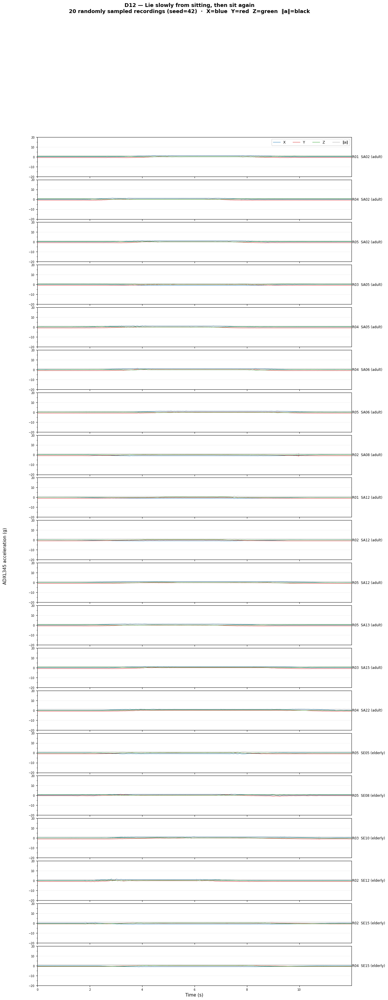

Saved signals_png/sisfall_gallery_D13.png


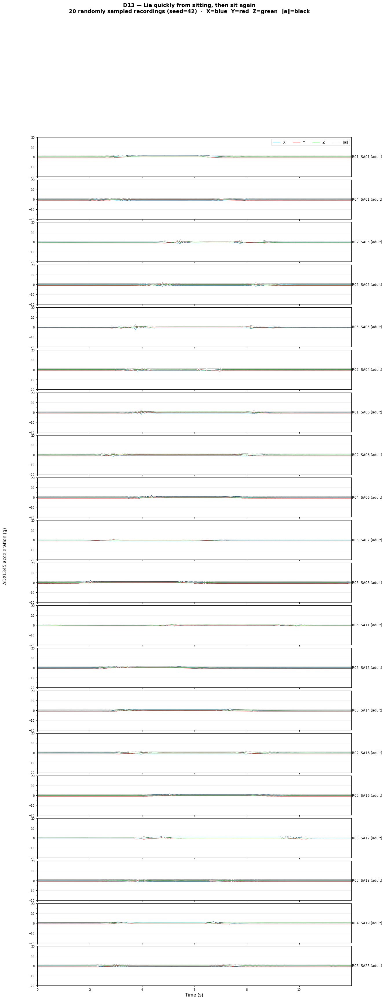

Saved signals_png/sisfall_gallery_D14.png


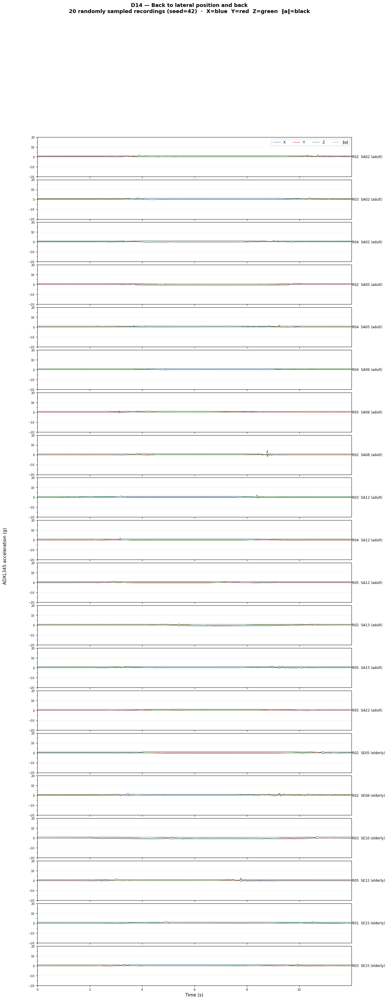

Saved signals_png/sisfall_gallery_D15.png


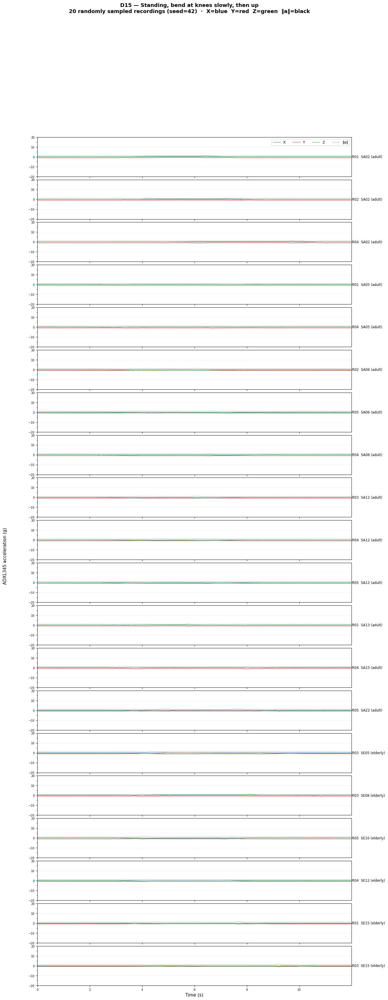

Saved signals_png/sisfall_gallery_D16.png


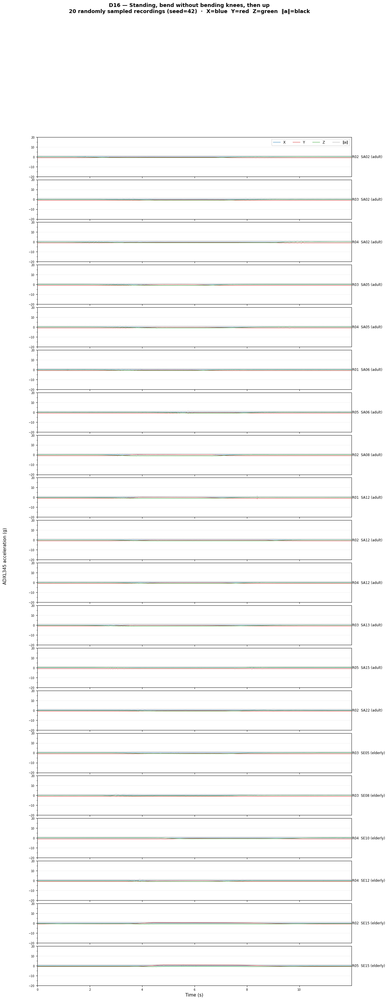

Saved signals_png/sisfall_gallery_D17.png


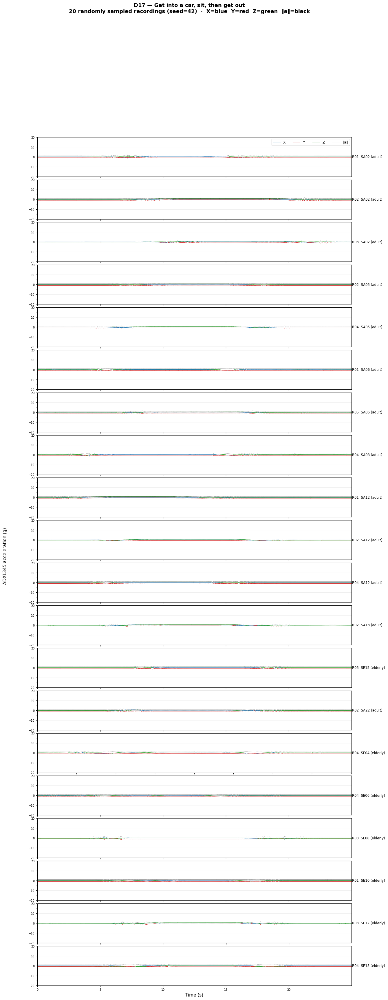

Saved signals_png/sisfall_gallery_D18.png


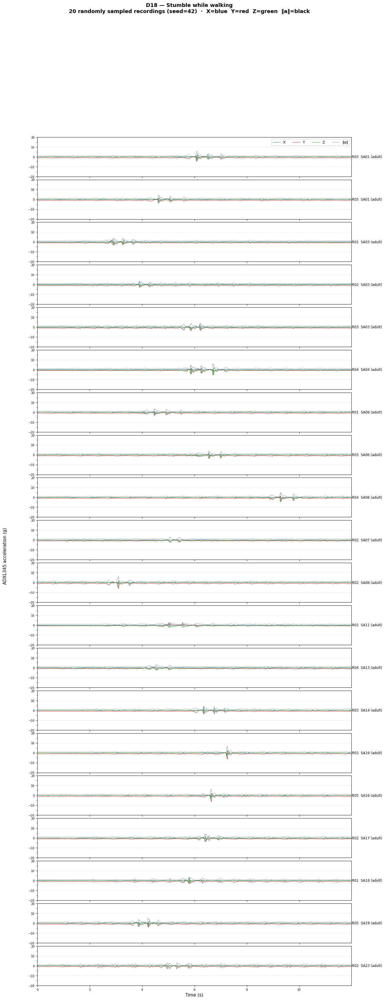

Saved signals_png/sisfall_gallery_D19.png


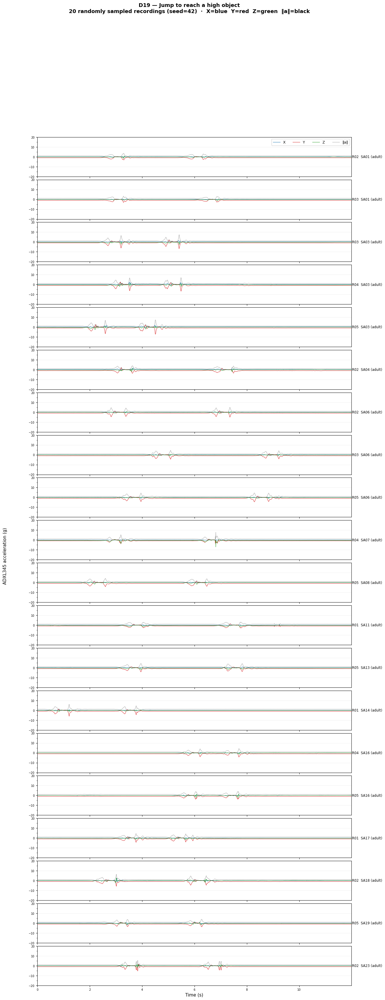

In [4]:
def plot_adl_class(code, files_for_code, n_plots=20, seed=42, save=True):
    """Plot up to n_plots randomly chosen recordings for a single ADL class."""
    random.seed(seed)
    chosen = sorted(random.sample(files_for_code, min(n_plots, len(files_for_code))))

    n = len(chosen)
    fig, axes = plt.subplots(
        n, 1,
        figsize=(14, n * 1.9),
        gridspec_kw={'hspace': 0.08},
    )
    if n == 1:
        axes = [axes]

    desc = ADL_DESC.get(code, code)

    for ax, fpath in zip(axes, chosen):
        fname = os.path.basename(fpath)
        _, subj, trial = fname.replace('.txt', '').split('_')
        group = 'adult' if subj.startswith('SA') else 'elderly'

        acc = load_adxl(fpath)
        t   = np.arange(len(acc)) / 200.0

        for i, (axis_name, color) in enumerate(zip(['X', 'Y', 'Z'], AXIS_COLORS)):
            ax.plot(t, acc[:, i], color=color, linewidth=0.8,
                    label=axis_name if ax is axes[0] else None)

        mag = np.linalg.norm(acc, axis=1)
        ax.plot(t, mag, color='black', linewidth=0.6, alpha=0.45,
                label='‖a‖' if ax is axes[0] else None)

        ax.axhline(0, color='grey', linewidth=0.4, linestyle=':')
        ax.set_xlim(0, t[-1])
        ax.set_ylim(-20, 20)
        ax.yaxis.set_major_locator(ticker.MultipleLocator(10))
        ax.yaxis.set_minor_locator(ticker.MultipleLocator(5))
        ax.tick_params(axis='y', labelsize=7)
        ax.tick_params(axis='x', labelsize=7)
        ax.grid(True, axis='y', alpha=0.2)

        label_text = f'{trial}  {subj} ({group})'
        ax.text(1.002, 0.5, label_text,
                transform=ax.transAxes,
                va='center', ha='left',
                fontsize=8.5)

        if ax is not axes[-1]:
            ax.set_xticklabels([])

    axes[-1].set_xlabel('Time (s)', fontsize=11)
    fig.text(0.04, 0.5, 'ADXL345 acceleration (g)', va='center',
             rotation='vertical', fontsize=11)
    axes[0].legend(loc='upper right', fontsize=9, ncol=4, framealpha=0.8)

    fig.suptitle(
        f'{code} — {desc}\n'
        f'{n} randomly sampled recordings (seed={seed})  ·  '
        'X=blue  Y=red  Z=green  ‖a‖=black',
        fontsize=13, fontweight='bold', y=1.002
    )

    if save:
        os.makedirs('signals_png', exist_ok=True)
        fname_out = f'signals_png/sisfall_gallery_{code}.png'
        plt.savefig(fname_out, dpi=120, bbox_inches='tight')
        print(f'Saved {fname_out}')

    plt.show()


for code in sorted(files_by_code):
    plot_adl_class(code, files_by_code[code], n_plots=20, seed=42)